### Inpainting demo

First, loading the esd-x model to verify erasure of van gogh concept

In [1]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt
from utils.inpainting_utils import load_model_inpaint_pipeline, generate_inpainting_images_with_mask_overlay,  display_images, calculate_clip_score

/share/u/kevin/miniconda3/envs/asdf_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


Loading pipeline components...: 100%|██████████| 7/7 [00:48<00:00,  6.91s/it]


✅ ESD-X model loaded successfully!


100%|██████████| 50/50 [00:03<00:00, 15.17it/s]


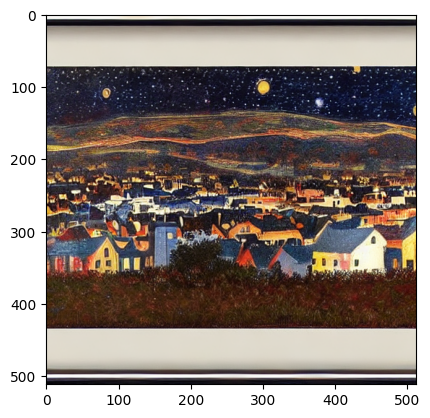

In [2]:
# Check for GPU availability (MPS for Apple Silicon or CUDA for NVIDIA GPUs)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load the ESD-X model from Hugging Face
model_id = "ErasureResearch/esdx_van_gogh"

pipeline = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device != "cpu" else torch.float32,  # Use FP16 for GPU, FP32 for CPU
    use_safetensors=True
).to(device)

print("✅ ESD-X model loaded successfully!")

# Sample text prompt for generation
prompt = "Starry Night By Van Gogh"

# Inference
with torch.inference_mode():
    image = pipeline(prompt).images[0]

# Display the generated image
plt.imshow(image)


## Inpainting on starry night with erased Van Gogh Model

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:02<00:00, 24.44it/s]


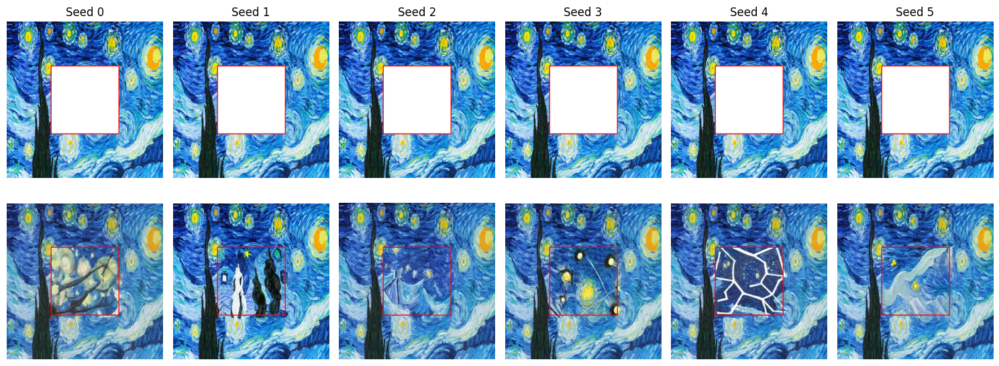

In [3]:
foundation_pipeline = "stable-diffusion-v1-5/stable-diffusion-v1-5"
pipeline = load_model_inpaint_pipeline("ErasureResearch/esdx_van_gogh", foundation_pipeline).to("cuda")
pipeline.safety_checker = None
seeds = [20, 2440, 1440, 1000, 3500, 4000]
prompt = "Starry Night By Van Gogh"

images, base_with_mask = generate_inpainting_images_with_mask_overlay("utils/center_square_mask.png", "utils/starry night.webp", pipeline, prompt, seeds)
display_images(images, base_with_mask)

## Calculating CLIP Scores and displaying best image

Best CLIP Score inpaint:  21.462993621826172


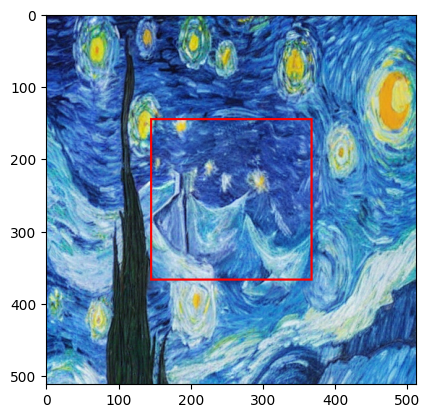

In [6]:
from transformers import CLIPProcessor, CLIPModel
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
model = model.to("cuda")  # Move the model to CUDA
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
best_image, best_score = calculate_clip_score(images, "airliner", "utils/center_square_mask.png", model, processor)
plt.imshow(best_image)
print("Best CLIP Score inpaint: ", best_score.item())

Loading pipeline for: base


100%|██████████| 50/50 [00:01<00:00, 25.76it/s]


Loading pipeline for: esdx


100%|██████████| 50/50 [00:02<00:00, 22.69it/s]


Loading pipeline for: esdu


100%|██████████| 50/50 [00:02<00:00, 22.64it/s]


Loading pipeline for: ga


Loading pipeline components...: 100%|██████████| 6/6 [00:36<00:00,  6.08s/it]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 50/50 [00:01<00:00, 25.41it/s]


Loading pipeline for: uce


100%|██████████| 50/50 [00:01<00:00, 25.70it/s]


Loading pipeline for: rece


100%|██████████| 50/50 [00:01<00:00, 26.01it/s]


Loading pipeline for: stereo


Loading pipeline components...: 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 50/50 [00:01<00:00, 25.34it/s]


Loading pipeline for: tv


Loading pipeline components...: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 50/50 [00:02<00:00, 21.88it/s]


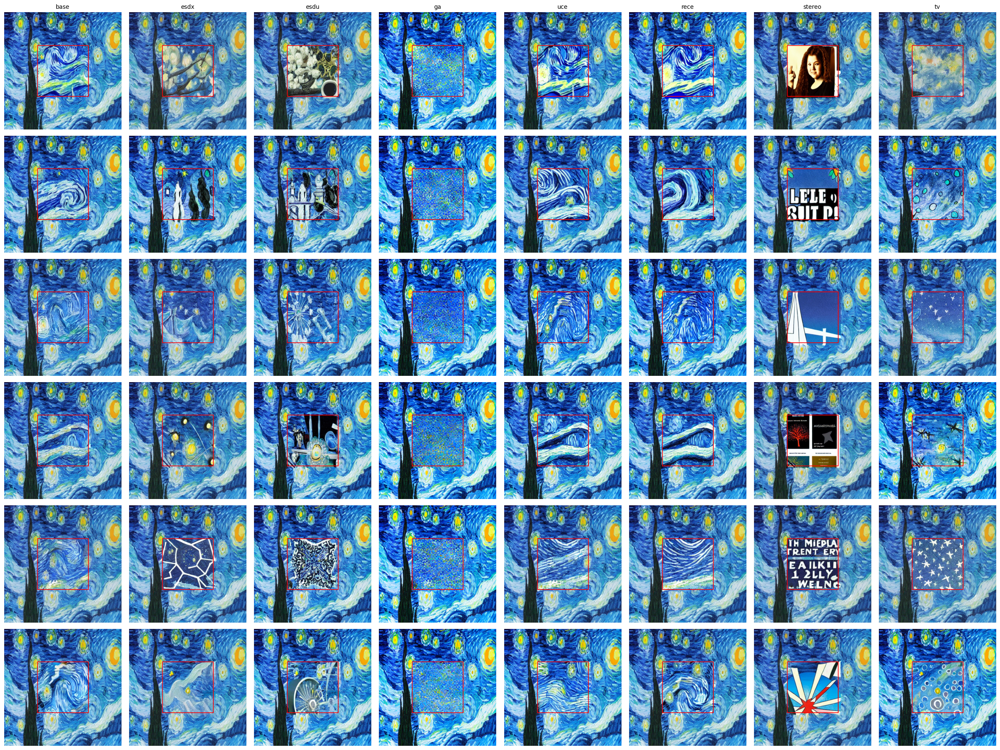

In [7]:
import torch
import matplotlib.pyplot as plt
from diffusers import StableDiffusionInpaintPipeline
from typing import List
from utils.inpainting_utils import load_model_inpaint_pipeline, generate_inpainting_images_with_mask_overlay

# === CONFIGURATION ===
foundation_pipeline = "stable-diffusion-v1-5/stable-diffusion-v1-5"
concept = "van_gogh"
prompt = "Starry Night by Van Gogh"
seeds = [20, 2440, 1440, 1000, 3500, 4000]

# List of model names and Hugging Face repo paths
methods = {
    "base": foundation_pipeline,
    "esdx": f"ErasureResearch/esdx_{concept}",
    "esdu": f"ErasureResearch/esdu_{concept}",
    "ga": f"ErasureResearch/ga_{concept}",
    "uce": f"ErasureResearch/uce_{concept}",
    "rece": f"ErasureResearch/rece_{concept}",
    "stereo": f"ErasureResearch/stereo_{concept}",
    "tv": f"ErasureResearch/tv_{concept}",
}

# === RUN INPAINTING FOR ALL MODELS ===
all_images = {}
for method, model_path in methods.items():
    print(f"Loading pipeline for: {method}")
    if method == "base":
        pipeline = StableDiffusionInpaintPipeline.from_pretrained(
            model_path, torch_dtype=torch.float16
        ).to("cuda")
    else:
        pipeline = load_model_inpaint_pipeline(model_path, foundation_pipeline).to("cuda")
    pipeline.safety_checker = None

    images, base_with_mask = generate_inpainting_images_with_mask_overlay(
        "utils/center_square_mask.png",
        "utils/starry night.webp",
        pipeline,
        prompt,
        seeds
    )
    all_images[method] = images

# === DISPLAY RESULTS AS A GRID ===
def display_grid(image_dict: dict, seeds: List[int]):
    n_rows = len(seeds)
    n_cols = len(image_dict)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 3 * n_rows))

    for col, (method, imgs) in enumerate(image_dict.items()):
        for row, img in enumerate(imgs):
            ax = axs[row, col] if n_rows > 1 else axs[col]
            ax.imshow(img)
            ax.axis("off")
            if row == 0:
                ax.set_title(method, fontsize=10)

    plt.tight_layout()
    plt.show()

display_grid(all_images, seeds)
